In [4]:
from IPython.display import Image
from IPython.core.display import HTML
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd

# Part 1. General Overview and Project Strategy

Each of us has played the Monopoly board game at least once in our lives. Those who have played more than 3-4 times may have noticed that players tend to land their tokens on some spaces (streets, avenues etc) more often, and some rarely. Based on this, experienced players adjust their strategy by buying property on more frequent spaces. Such an approach should be called empirical. That is, the more game experience a player has, the more optimal his strategy is. 

But what if we try to apply a bit of computer science in order to look at the mathematical background of this "Property Trading Game". Are there any interesting features of the Monopoly game board that were laid down by the game developers but hidden from the eyes of ordinary players under layers of probabilistic calculations?

I hope that a little bit of Python code as well as Graph Theory will help us to get under the hood and explore the game at a mathematical angle. 

Basically, to reach our goal we should perform three following steps:
* create every possible path from each game board space and compute probability related to the path;
* build Directed Graph based on the results of the 1st step;
* apply PageRunk algorithm to dicover most frequent spaces on the game board.


    

Don't worry if any of these steps looks pretty difficult for you so far. I will go through each step with detailed explanation as well as related code snippets. 

### Disclaimer

The project is not a good fit for those looking for perfect winning game strategy, as eventually Monopoly game is not about probabilities only. I guess it should contain additional layers not covered by this project, such as expected value of income from owning different kinds of property on game board spaces. That's a great room for some additional work around this project. Maybe one day I will cover it up as well. However, once again the primary goal now is to discover some kind of underlying structure of the game, just out of curiosity.

# Part 2. Creating all routes available on game board

As you may have already guessed each space of the game board are supposed to be nodes for our future graph (network). So, in order to proceed we should build connections (a.k.a. edges) between these nodes. 

First things first, let me introduce you main elements of the game that are used within this project.

### Game Board

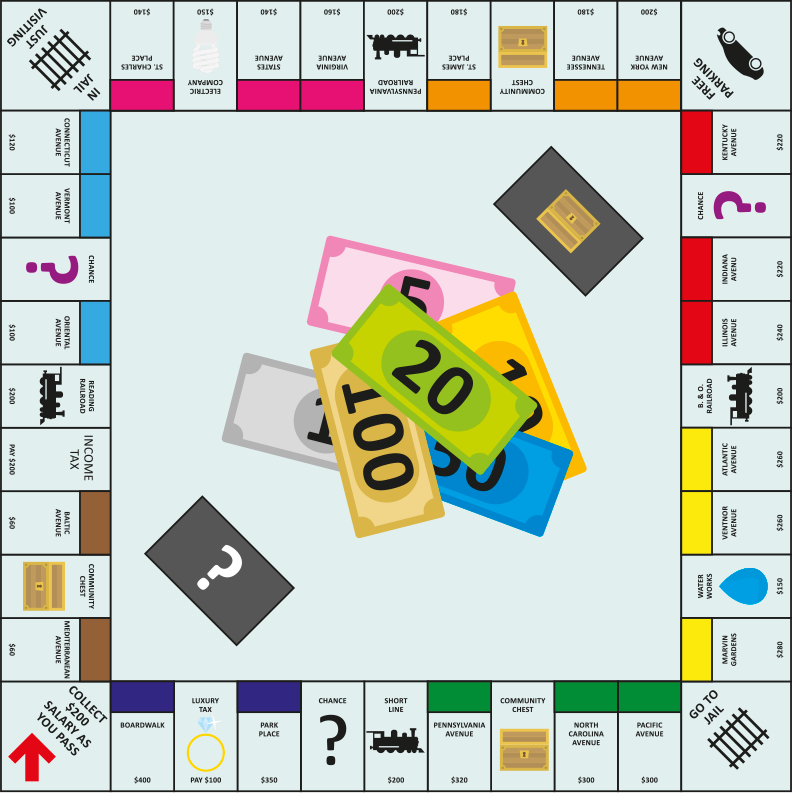

In [5]:
Image(filename = "pictures/usa game board.png", width=700, height=700)

Let's implement same game board as a simple Python list. The order of the elements of the list should correspond to the location on the board. Since the game starts from 'Collect $200 salary as you pass' space we should use this one as the 1st element of the list.  

*By the way, this space is more known as 'Go' field, so wee will use this alias in Python code instead of long official name). 

In [6]:
# game board in Python
board = ['Go', 'Mediterranean Avenue', 'Community Chest 1',
         'Baltic Avenue', 'Income Tax', 'Reading Railroad',
         'Oriental Avenue', 'Chance 1', 'Vermont Avenue',
         'Connecticut Avenue', 'Just visiting', 'St. Charles Place',
         'Electric Company', 'States Avenue', 'Virginia Avenue',
         'Pennsylvania Railroad', 'St. James Place', 'Community Chest 2',
         'Tennessee Avenue', 'New York Avenue', 'Free Parking',
         'Kentucky Avenue', 'Chance 2', 'Indiana Avenue',
         'Illinois Avenue', 'B & O Railroad', 'Atlantic Avenue',
         'Ventnor Avenue', 'Water Works', 'Marvin Gardens',
         'Go to jail', 'Pacific Avenue', 'North Carolina Avenue',
         'Community Chest 3', 'Pennsylvania Avenue', 'Short Line',
         'Chance 3', 'Park Place', 'Luxury Tax', 'Boardwalk']

## Dice

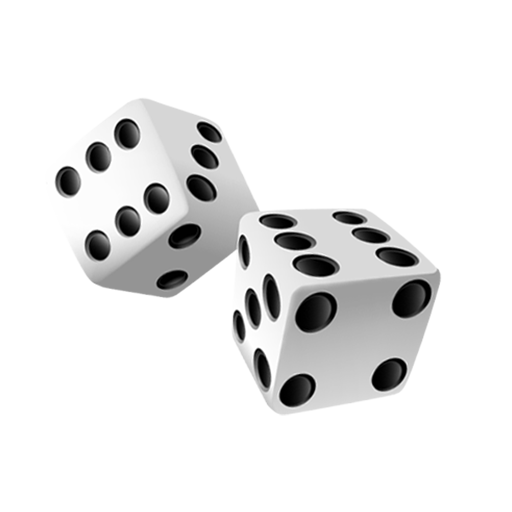

In [7]:
Image(filename = "pictures/dice.png", width=200, height=200)

During each turn, the player rolls the dice and moves his token forward based on the amount rolled on the dice.
So, since we have only two dice, there are 36 (6 squared) possible ways how dice will land. 

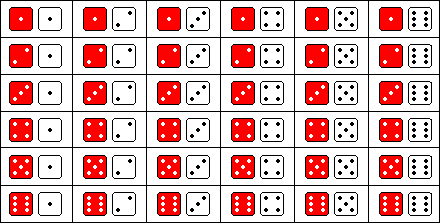

In [8]:
Image(filename = "pictures/dice_combos.gif", width=400, height=400)

At the same time, if wee sum up values of each die in each of 36 combinations, we get only 11 possible unique sums (2 through 12). At this point, it means that starting from one game space, we can end up in 11 different target spaces (move our token to 11 different game fields) depending on a particular dice outcome. 

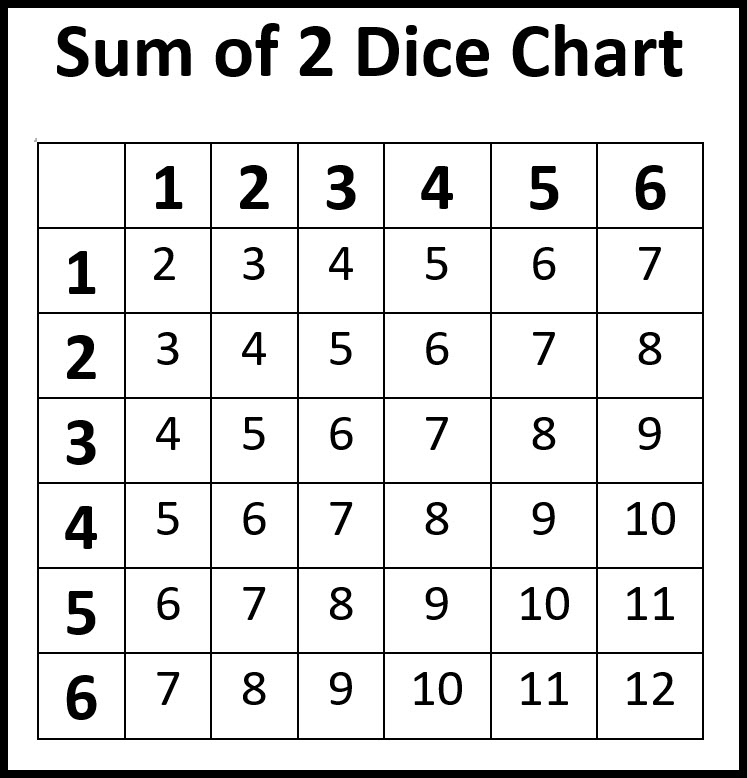

In [9]:
Image(filename = "pictures/dice_sums.jpeg", width=400, height=400)

Finally, each of the possible outcome (sum) has different probability to occur. For example, the we can get the outcome of 2 from the only combination of dice: (1,1) --> probability = 1/36. 

While an outcome of 3 can be obtained from two separate combinations: (2,1), (1,2) --> probability = 2/36.

Here is full probability distribution for each outcome. The chances to get outcome of 7 is the highest, as it can be provided by the highest number of combinations (6 out of 36).

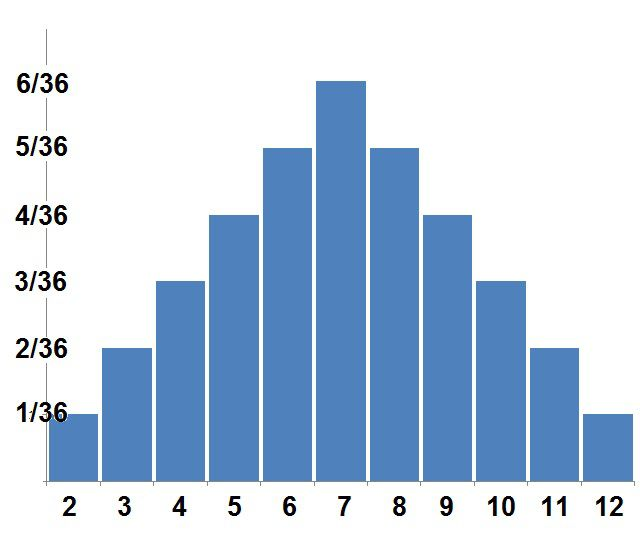

In [10]:
Image(filename = "pictures/dice_distributions.jpeg", width=400, height=400)

Now, let's turn all this stuff into code by using simple Python dictionary storing each possible outcome and its probability as key:value pairs.

In [11]:
probs = {2: 1 / 36, 3: 2 / 36, 4: 3 / 36, 5: 4 / 36, 6: 5 / 36,
         7: 6 / 36, 8: 5 / 36, 9: 4 / 36, 10: 3 / 36, 11: 2 / 36,
         12: 1 / 36}

## Checkpoint

So, for now we can create routes between two simple game spaces and we know how to calculate probability of moving to different target spaces based on the given dice outcome. 

The 'simple' game space means that our target space is final within this move. For example, while being on 'Go' space we roll the dice and obtain (2,1) combination. Ou outcome is 3 (2+1). So, we get the following route: 

**('Go'-'Baltic Avenue' with probability to occur: 2/36).**


However, Monopoly game board contains special spaces, which in case of getting on them, can reroute us to another space. That is where 'Chance' and 'Community Chest' come into play.

## Chance spaces / cards

Monopoly game board contains 3 spaces named 'Chance'. If you step into on of these, you shoud take one of 16 Chance cards. 

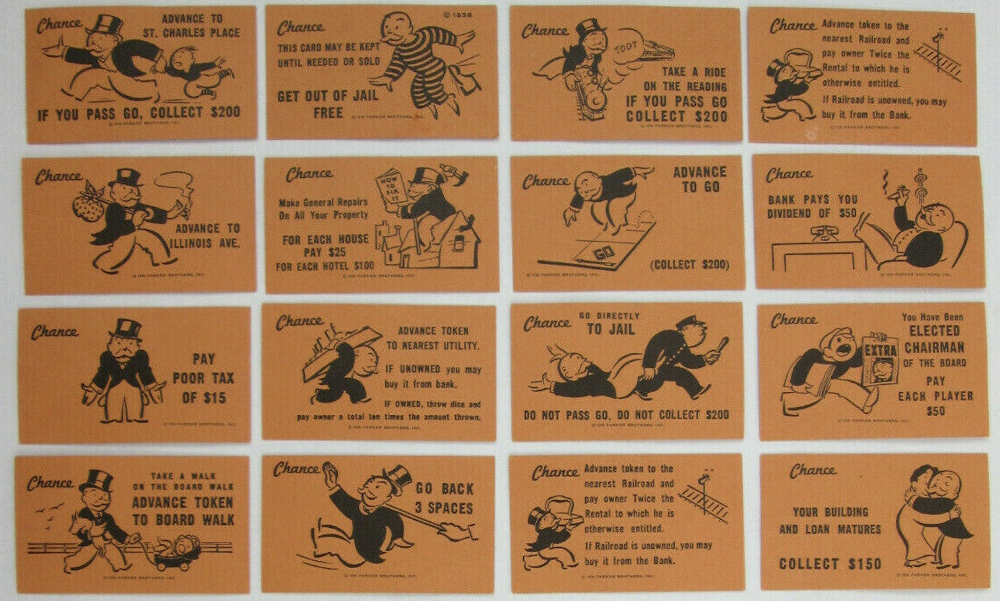

In [12]:
Image(filename = "pictures/chance_cards.png", width=700, height=700)

Each of this card makes us to do some actions or get some benefits. In the context of our moving across the game board task, we can split these cards into 3 categories:
* cards making us eventually stay on the chance space (e.g. pay poor tax of $15);
* cards making us move forward to explicitly specified space (e.g. advance to Illinoice Ave);
* cards making us move forward to some space based on the rule set on the card (e.g advance to the nearest railroad, advance to the nearest utility, go back 3 spaces).

Based on it, we can create all combinations of drawing Chance card and compute probability of getting it. Let's store it in Python dictionary

In [13]:
chance_probs = {'Stay': 6 / 16, 'St. Charles Place': 1 / 16,
                'Illinois Avenue': 1 / 16, 'Boardwalk': 1 / 16,
                'Nearest Utility' : 1 / 16, 'Go back 3': 1 / 16,
                'Nearest Railroad': 2 / 16, 'Go to jail': 1 / 16,
                'Go': 1 / 16, 'Reading Railroad': 1/16
                }

For now, you may be curios how can we deal targets like 'Nearest Utility' or 'Go back 3'. Well, we need to define functions that process such rules and return the FINAL destination of the move.  

Those are pretty simple functions since we deal with regular Python data structures. 

For example:

In [14]:
def get_back_3(current, board):
    curr_index = board.index(current)
    dest_index = curr_index - 3
    return board[dest_index]


The function above is pretty simple, isn't it?

Let's take a look at more complicated one:

In [15]:
import numpy as np
# order should be the same as utilities are located on board
utilities = ('Electric Company', 'Water Works')

# order should be the same as railroads are located on board
railroads = ('Reading Railroad', 'Pennsylvania Railroad', 
             'B & O Railroad', 'Short Line')


def get_nearest_utility(current, board, utilities_names):
    curr_index = board.index(current)

    forward_board = board[curr_index:]
    filtered_utils = [railroad for railroad in utilities_names if railroad in forward_board]

    if len(filtered_utils) == 0:
        return utilities_names[0]

    utils_distances = [forward_board.index(util) - curr_index for util in filtered_utils]
    closest_util_index = np.argmin(utils_distances)

    return filtered_utils[closest_util_index]

So, in order to get nearest utility (while being on chance space) first of all we should cut off all spaces preceeding the current chance space as we can go ahead of the game board only, not back. Then, we should look up those utilities that are still in remaining board (forward board) and choose one with the shortest distance from current chance space. In case if there is no utility left in forward board, we should use the first one after the start of the entire board. ('Electric Company'). 


The same rules should be applied to 'Go to the nearest Railroad' chance card as well. 

## Community Chest  spaces / cards

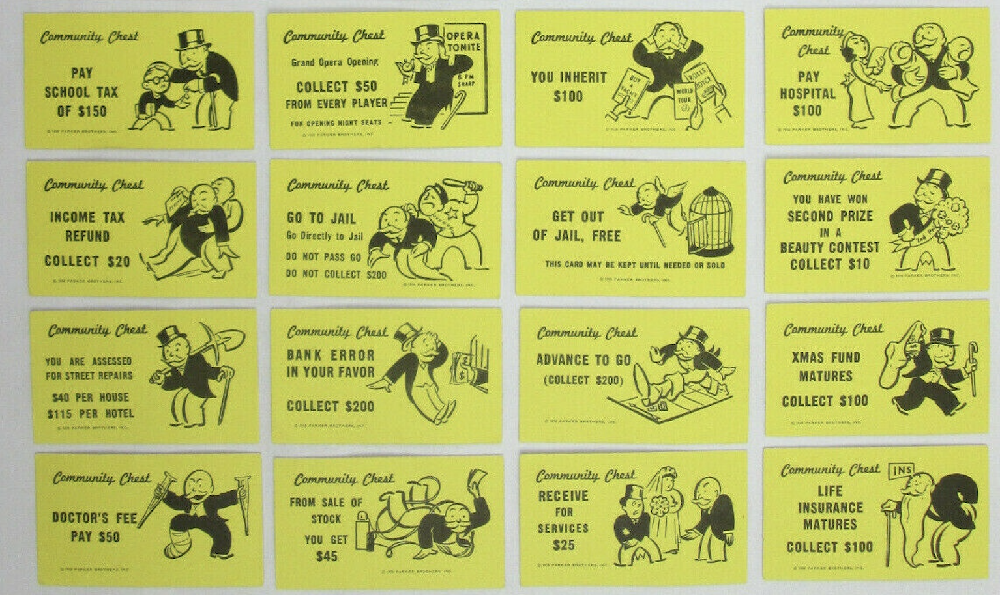

In [16]:
Image(filename = "pictures/cc_cards.png", width=700, height=700)

The situation with Community Chest cards is pretty the same. The only difference here, is that an absolute majority of these cards makes you stay on the same Community Chest space at the end of the move. And there are only 2 cards odering you to either go to jail or advance to 'Go' space.  

So, let's implement another Python dictionary storing data from these cards:

In [17]:
cc_probs = {'Stay': 14 / 16, 'Go to jail': 1 / 16, 'Go': 1 / 16}

## Dealing with probabilities while getting into Chance or Community Chest spaces

Let's sort it out using the following example:

* 1) You start a move being on 'Go' space;
* 2) You roll the dice and get combination of (3,4). So the outcome is 7;
* 3) You are moving your token 7 spaces ahead and getting onto 'Chance 1' space;
* 4) You are drawing a random Chance card and getting 'Go back 3 spaces' order;
* 5) You are moving your token 3 steps back, and getting into Income Tax space.

You entire route wihin this move is the follwing: 'Go'-'Chance 1'- 'Income tax'. 
But what is the probability of getting such route? 

So, let's split it into two parts:
* 1) 'Go'-'Chance 1' route
* 2) 'Chance 1'-'Income Tax' route.


The probability for the first part is 6/36 (as our dice outcome is 7).
The probability to draw 'Go back 3 spaces' chance card is 1/16. 

In order to compute the final probability (the is the probability of getting 7 as dice outcome and drawing 'Go back 3 spaces' chance card we just need to multiple both probabilities: 6/36 * 1/16 = 0.01042. 

So, our final route should be stored as following: ('Go'-'Income Tax', with probability of 0.01042). 

So, for now we know that starting from 'Go' space we can move to 'Chance 1' space and eventually end up on 'Income Tax' space with probability of 0.01042. 


### Be aware

But, the important point here, that we can also move from 'Go' to 'Income Tax' directly by getting 4 as dice outcome with probability of 4/36. 

Thus, there are at least to ways how we can go to 'Income Tax' starting from 'Go' space.

Since for the purpose of this project it doesn't matter whether 'Chance' or 'Community Chest' spaces is as temporary stop within one move, we can just add up the probabilities of ways of getting the same route (probability of getting either way). So, the final final probability of getting route 'Go'-'Income Tax' in either way is 4/36 + 0.01042 = 0.12153.

## Jail space 

There is one exclusion for creating routes accross the entire board. 
Once you got onto "Go to jail' space, the only way you can go furher is 'Just visiting / In jail' space. 

So, we should not create routes starting from 'Go to jail' space just like we did for other spaces. Instead, we have create a route 'Go to jail' - 'Just visiting/In jail' with probability of 1.

## Wrap it up

Finally we are ready to build a function that implements the whole logic described in Part 1 above and build all routes available on the game board. The code below starts with some simple helping functions used in main function (create routes) in order to avoid repetetive code.

In [18]:
import numpy as np


def create_path(start, dest, prob):
    return ((start, dest), prob)

def get_dest(start, board, outcome):
    index_range = len(board)-1
    if board.index(start) + outcome <= index_range:
        return board[board.index(start) + outcome]
    else:
        i = outcome - (index_range-board.index(start)) - 1
        return board[i]

def get_back_3(current, board):
    curr_index = board.index(current)
    dest_index = curr_index - 3
    return board[dest_index]

def get_nearest_utility(current, board, utilities_names):
    curr_index = board.index(current)

    forward_board = board[curr_index:]
    filtered_utils = [railroad for railroad in utilities_names if railroad in forward_board]

    if len(filtered_utils) == 0:
        return utilities_names[0]

    utils_distances = [forward_board.index(util) - curr_index for util in filtered_utils]
    closest_util_index = np.argmin(utils_distances)

    return filtered_utils[closest_util_index]

def get_nearest_railroad(current, board, railroads_names):
    curr_index = board.index(current)

    forward_board = board[curr_index:]

    filtered_railroads = [railroad for railroad in railroads_names if railroad in forward_board]

    if len(filtered_railroads) == 0:
        return railroads_names[0]

    railroads_distances = [forward_board.index(railroad) - curr_index for railroad in filtered_railroads]
    closest_railroad_index = np.argmin(railroads_distances)

    return filtered_railroads[closest_railroad_index]


# main function
def create_routes(board, probs, chance_probs, cc_probs, utilities, railroads):
    combos = []
    
    for index, street in enumerate(board):
        if street != 'Go to jail':
            for outcome in probs.keys():
                end = get_dest(street, board, outcome)
                if end in ('Chance 1', 'Chance 2', 'Chance 3'):
                    # paste code below for chance
                    for final_outcome in chance_probs.keys():
                        if final_outcome == 'Stay':
                            final_prob = probs[outcome] * chance_probs['Stay']
                            path = create_path(street, end, final_prob)
                        elif final_outcome == 'Go back 3':
                            new_end = get_back_3(end, board)
                            final_prob = probs[outcome] * chance_probs['Go back 3']
                            path = create_path(street, new_end, final_prob)
                        elif final_outcome == 'Nearest Utility':
                            new_end = get_nearest_utility(end, board, utilities)
                            final_prob = probs[outcome] * chance_probs['Nearest Utility']
                            path = create_path(street, new_end, final_prob)
                        elif final_outcome == 'Nearest Railroad':
                            new_end = get_nearest_railroad(end, board, railroads)
                            final_prob = probs[outcome] * chance_probs['Nearest Railroad']
                            path = create_path(street, new_end, final_prob)
                        else:
                            path = create_path(street, final_outcome, probs[outcome] * chance_probs[final_outcome])

                        combos.append(path) # adds all chance outcome paths

                elif end in ('Community Chest 1', 'Community Chest 2', 'Community Chest 3'):
                    for final_outcome in cc_probs.keys():
                        if final_outcome == 'Stay':
                            final_prob = probs[outcome] * cc_probs['Stay']
                            path = create_path(street, end, final_prob)
                        else:
                            path = create_path(street, final_outcome, probs[outcome] * cc_probs[final_outcome])

                        combos.append(path)
                else:
                    path = create_path(start=street, dest=end, prob=probs[outcome])
                    combos.append(path)


    combos.append((('Go to jail', 'Just visiting'), 1))

    
    # add probabilities of same routes as described in 'Be aware' subsection above
    tup = {i:0 for i, v in combos}
    for key, value in combos:
        tup[key] = tup[key]+value

    unique_combos = list(map(tuple, tup.items()))

    return unique_combos

Let's call the main function, store the results in ```combos``` variable and take a look at it.

In [19]:
combos = create_routes(board, probs, chance_probs, cc_probs, utilities, railroads)

In [20]:
combos

[(('Go', 'Community Chest 1'), 0.024305555555555552),
 (('Go', 'Go to jail'), 0.012152777777777776),
 (('Go', 'Go'), 0.012152777777777776),
 (('Go', 'Baltic Avenue'), 0.05555555555555555),
 (('Go', 'Income Tax'), 0.09375),
 (('Go', 'Reading Railroad'), 0.12152777777777778),
 (('Go', 'Oriental Avenue'), 0.1388888888888889),
 (('Go', 'Chance 1'), 0.0625),
 (('Go', 'St. Charles Place'), 0.06597222222222222),
 (('Go', 'Illinois Avenue'), 0.010416666666666666),
 (('Go', 'Boardwalk'), 0.010416666666666666),
 (('Go', 'Electric Company'), 0.03819444444444444),
 (('Go', 'Pennsylvania Railroad'), 0.020833333333333332),
 (('Go', 'Vermont Avenue'), 0.1388888888888889),
 (('Go', 'Connecticut Avenue'), 0.1111111111111111),
 (('Go', 'Just visiting'), 0.08333333333333333),
 (('Mediterranean Avenue', 'Baltic Avenue'), 0.027777777777777776),
 (('Mediterranean Avenue', 'Income Tax'), 0.0642361111111111),
 (('Mediterranean Avenue', 'Reading Railroad'), 0.09201388888888888),
 (('Mediterranean Avenue', 'Ori

# Part 2. Creating  and Exploring Monopoly Graph (Network) 

Now, when we already have all possible routes, we can go ahead and create Directed Graph using our data.

Let me remind you, that a graph (network) is nothing but set of elements (nodes) in some way connected (by edges). 
The nodes and edges of a graph can have different attributes like label, weights, color to name a few.

Directed graph (network) means that connections (edges) between nodes are made such way that enables you to move from one element to enother only in specified direction. Of course, two nodes can have two edges directed in from one to another, so that you move from one element to another and vice versa. 

Let's take a look a simple directed graph. 

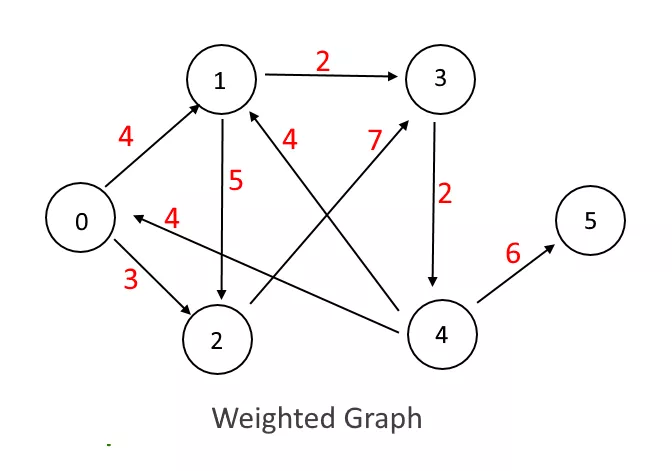

In [21]:
Image(filename = "pictures/simple_graph.jpeg", width=700, height=700)

This graph is called weighted, since its edges has 'weight' attribute. It is also a 'directed' one since arrows specify directions of nodes. 

In this project we want to create similar Weighted Directed Graph using our routes data.
The nodes of the graph should be Board Space names, the edges of the graphs - possible routes from one space to another', and weights of such edges - the probabilities of each route computed during the Part 1.

For building the graph let's use NetworkX library. It is pretty simple to use.

In [22]:
# create an instance of Directed graph class
G = nx.DiGraph()

In [23]:
# create all edges iterating over all possible routes stored in combos variable
for path in combos:
    G.add_edge(path[0][0], path[0][1], weight=path[1])

That's it. Our Monopoly Directed Weighted Graph is ready. Like I said, the NetworkX library is really simple to use.
Let's check elements of the graph.

In [24]:
G.edges

OutEdgeView([('Go', 'Community Chest 1'), ('Go', 'Go to jail'), ('Go', 'Go'), ('Go', 'Baltic Avenue'), ('Go', 'Income Tax'), ('Go', 'Reading Railroad'), ('Go', 'Oriental Avenue'), ('Go', 'Chance 1'), ('Go', 'St. Charles Place'), ('Go', 'Illinois Avenue'), ('Go', 'Boardwalk'), ('Go', 'Electric Company'), ('Go', 'Pennsylvania Railroad'), ('Go', 'Vermont Avenue'), ('Go', 'Connecticut Avenue'), ('Go', 'Just visiting'), ('Community Chest 1', 'Income Tax'), ('Community Chest 1', 'Reading Railroad'), ('Community Chest 1', 'Oriental Avenue'), ('Community Chest 1', 'Chance 1'), ('Community Chest 1', 'St. Charles Place'), ('Community Chest 1', 'Illinois Avenue'), ('Community Chest 1', 'Boardwalk'), ('Community Chest 1', 'Electric Company'), ('Community Chest 1', 'Pennsylvania Railroad'), ('Community Chest 1', 'Go to jail'), ('Community Chest 1', 'Go'), ('Community Chest 1', 'Vermont Avenue'), ('Community Chest 1', 'Connecticut Avenue'), ('Community Chest 1', 'Just visiting'), ('Community Chest 1

In [25]:
G.nodes

NodeView(('Go', 'Community Chest 1', 'Go to jail', 'Baltic Avenue', 'Income Tax', 'Reading Railroad', 'Oriental Avenue', 'Chance 1', 'St. Charles Place', 'Illinois Avenue', 'Boardwalk', 'Electric Company', 'Pennsylvania Railroad', 'Vermont Avenue', 'Connecticut Avenue', 'Just visiting', 'Mediterranean Avenue', 'States Avenue', 'Virginia Avenue', 'St. James Place', 'Community Chest 2', 'Tennessee Avenue', 'New York Avenue', 'Free Parking', 'Kentucky Avenue', 'Chance 2', 'Water Works', 'B & O Railroad', 'Indiana Avenue', 'Atlantic Avenue', 'Ventnor Avenue', 'Marvin Gardens', 'Pacific Avenue', 'North Carolina Avenue', 'Community Chest 3', 'Pennsylvania Avenue', 'Short Line', 'Chance 3', 'Park Place', 'Luxury Tax'))

In [26]:
print(f'Number of nodes: {len(G.nodes)}')
print(f'Number of edges: {len(G.edges)}')

Number of nodes: 40
Number of edges: 619


So, we have all 40 game board spaces implemented, and WOW we've got 619 unique connections between these nodes. 

Let's try to display our graph using NetworkX in-built vizualisation tools

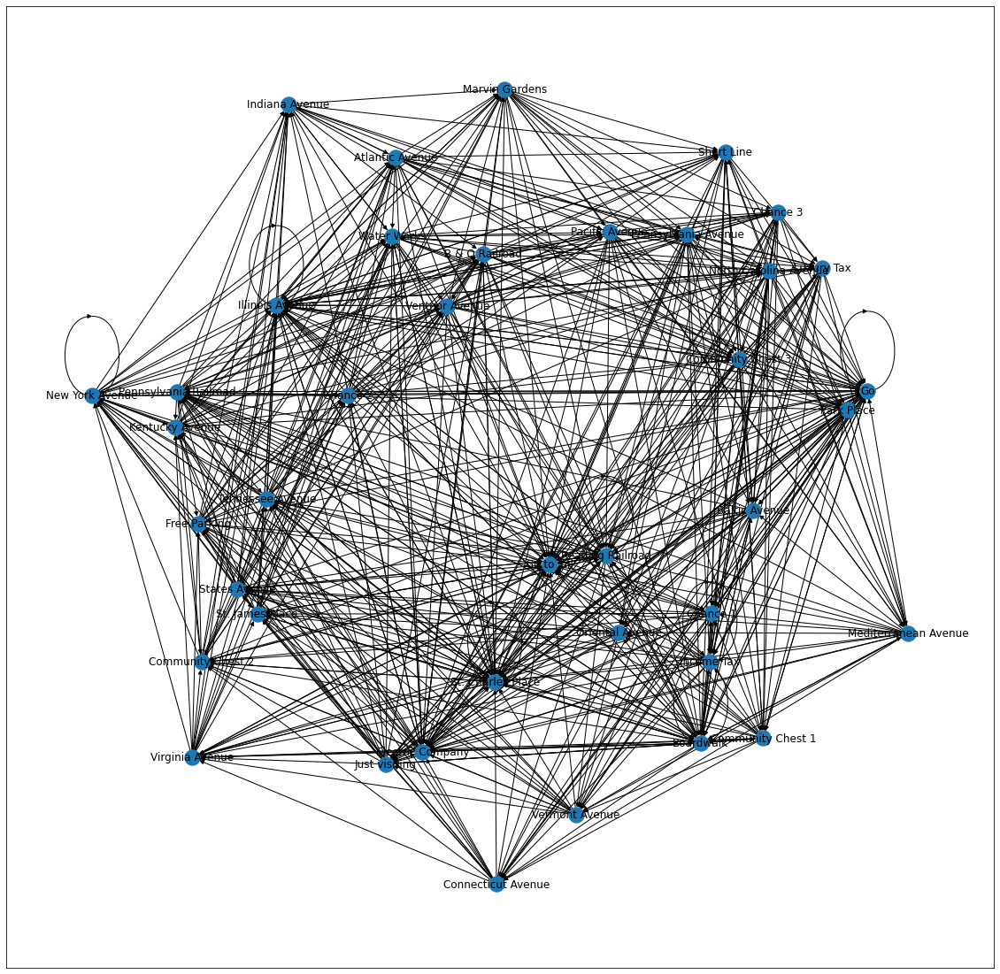

In [27]:
fig = plt.figure(figsize=(20,20))
nx.draw_networkx(G)

NetworkX also allows us to try other layouts for graph visualisation.

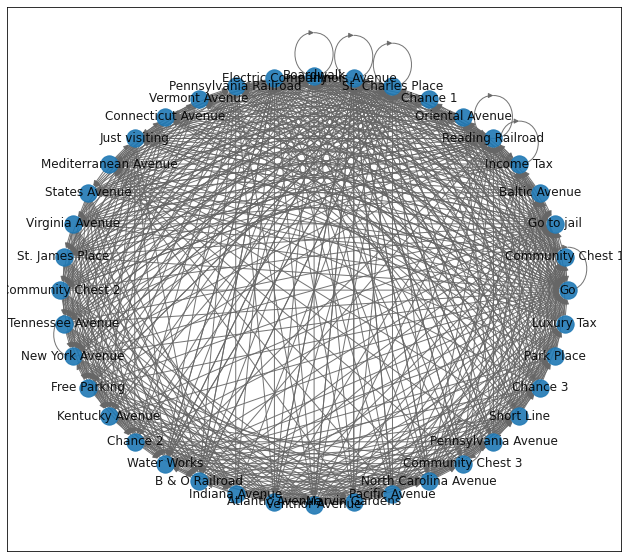

In [28]:
fig2 = plt.figure(figsize=(11,10))
pos = nx.circular_layout(G)
nx.draw_networkx(G, pos, alpha=0.9, edge_color='.4')

It still looks pretty strange, since we've got a lot of nodes and huge amount of edges. 

Maybe you are suspicious about those looped edged eround some nodes on the top of the graph. It is ok, they just indicate that you can start and end up on the same board space within the same move. 

But, here is a question: can we somehow display our graph with more inutitive layout? Let's say, we want to place our nodes just like they are located on game board.

Well, we can't do it within NetworkX in-built functions. 
We can try to set node locations using matplotlib, but it would require a lot of code underneath. 

I think, that the optimal soltion to configure our graph layout is to use Gephi - a tool for graphs/networks analysis.

But, don't forget to save you NetworkX graph locally, to load it into Gephi.

You can do it in folowing way:

In [29]:
# nx.write_gexf(G, 'mygraph.gexf')

Feel free to explore NetworkX docs to find another in-built functions for saving your graphs using other formats. 

So, while trying to recreate the original Monopoly board game structure using the graph that we have just created, I got something like this:

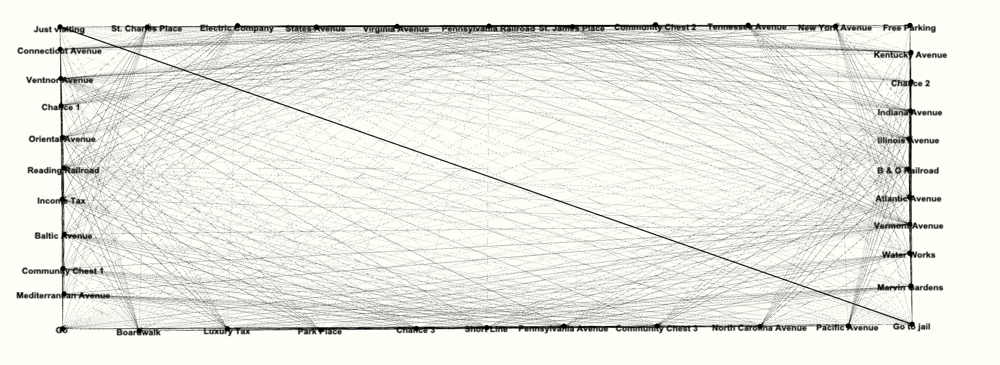

In [30]:
Image(filename = "pictures/original_layout.png", width=1000, height=1000)

So, not we have one more view to see how all our board spaces interact. 

Can you see that bold straight line from 'Go to jail' to 'Just visiting'. That's our dummy route, with max posible probability 1. 

The problem with this picture, that a lot of edgest among horizontally layed nodes as well edges among vertically layed nodes overlay and we do not really see them.

If we want to save the original structure and see all available routes, we can display our graph like this:


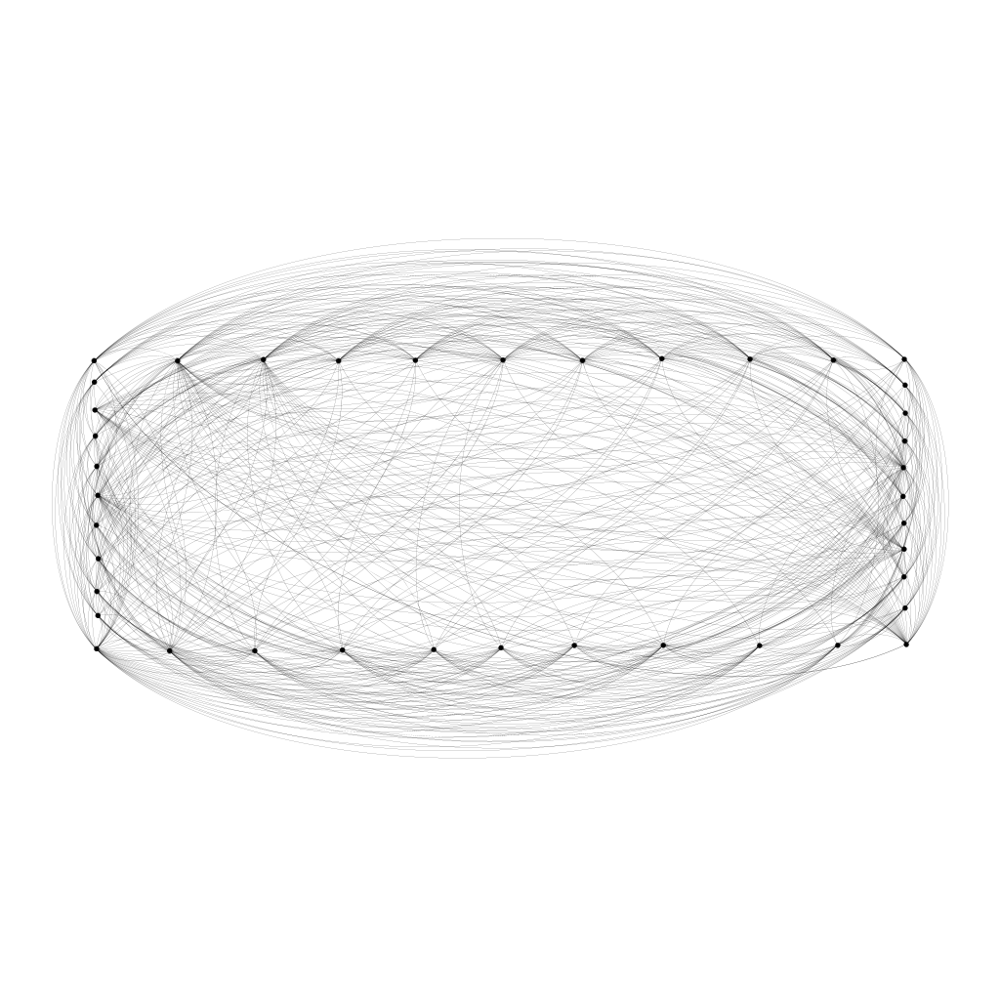

In [32]:
Image(filename = "pictures/full_graph.png", width=1000, height=1000)

# Part 3. Computing PageRank 

According to Wikipedia, PageRank (PR) is an algorithm used by Google Search to rank web pages in their search engine results. It is named after both the term "web page" and co-founder Larry Page. PageRank is a way of measuring the importance of website pages. 

According to Google:

PageRank works by counting the number and quality of links to a page to determine a rough estimate of how important the website is. The underlying assumption is that more important websites are likely to receive more links from other websites.

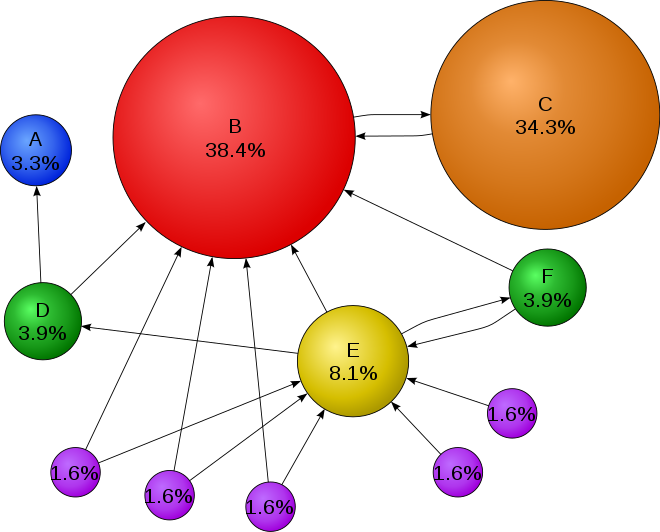

In [34]:
Image(filename = "pictures/google_pagerank.png", width=600, height=600)

Basically this algorithm calculates the probability with which a random walker would stop on some node after pretty big number of moves across the graph. In other words, random walker at each step randomly chooses the edge to go further. Whithin classic way of implementation, the more links lead to a node, the more probability that random walker wille ventually stop on that node. It means that each edge has the same probability to be walked through by the random walker. 

But, the point is, that we can feed some additional data to the PageRank algorithm - probabilities (weights). 

In this case, random walker would be less random as it will take into account probabilities associated with each node-to-node path. 

Fortunately, PageRank algorithm is implemented within NetworkX library, so it takes only two line of codes to get the results.

In [35]:
ranks = nx.pagerank(G)

In [36]:
sorted_ranks = dict(sorted(ranks.items(), key=lambda item: item[1]))

In [37]:
sorted_ranks

{'Chance 3': 0.010801100833283473,
 'Chance 1': 0.011074942587084354,
 'Chance 2': 0.012296774705629149,
 'Community Chest 1': 0.0195629277154174,
 'Mediterranean Avenue': 0.021594581252603093,
 'Park Place': 0.021611086345608415,
 'Luxury Tax': 0.021626327714757736,
 'Baltic Avenue': 0.02203739222753436,
 'Oriental Avenue': 0.022868617687336192,
 'Community Chest 3': 0.02311774598770173,
 'Connecticut Avenue': 0.02335651501859314,
 'Vermont Avenue': 0.023421666722926046,
 'Income Tax': 0.023425539111842374,
 'Short Line': 0.023490613959051342,
 'States Avenue': 0.023804757074407233,
 'Pennsylvania Avenue': 0.024028605256034855,
 'Virginia Avenue': 0.024362602655640796,
 'Community Chest 2': 0.024637657932479354,
 'Marvin Gardens': 0.024885424294096632,
 'North Carolina Avenue': 0.025073862287553435,
 'Boardwalk': 0.025443135417429822,
 'Ventnor Avenue': 0.0255134814099071,
 'Pacific Avenue': 0.025535448437833237,
 'Atlantic Avenue': 0.025722722997289664,
 'Electric Company': 0.0258653

So, here is full list of board space: pagerank value pairs.

We can see that Chance spaces are supposed to be the least frequent for players in game. At the same time, it seems that the most frequent spaces you would face are 'Go to jail' and 'Just visiting'. 


However, ff you are trying to derive some winning game strategy out of this top, you would not be really interested in spaces like Chance, Community Chest, Go to jail, Just visiting since you just cannot decide whether to buy them. It is just a matter of probability how often you would end up on them at each move.

When it comes to spaces you can buy and set additional properties on (houses, hotels), it looks like the probability is quite uniformely distributed across the majority of them. 


But still we can see that 'Illinois Avenue', 'New York Avenue', ''B & O Railroad', 'Reading Railroad' have much higher PageRank value comparing to 'Mediterranian Avenue' or 'Park Place'. So, they can be a good choice to consider on while making a decision whether to but them. 

